___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Session - 3<br><br>Regression with ANN<br><br>KC House Data<br><h1>

We will be using a dataset from Kaggle:

https://www.kaggle.com/harlfoxem/housesalesprediction

**Feature Columns:**
    
1. id - Unique ID for each home sold
2. date - Date of the home sale
3. price - Price of each home sold
4. bedrooms - Number of bedrooms
5. bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
6. sqft_living - Square footage of the apartments interior living space
7. sqft_lot - Square footage of the land space
8. floors - Number of floors
9. waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
10. view - An index from 0 to 4 of how good the view of the property was
11. condition - An index from 1 to 5 on the condition of the apartment,
12. grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
13. sqft_above - The square footage of the interior housing space that is above ground level
14. sqft_basement - The square footage of the interior housing space that is below ground level
15. yr_built - The year the house was initially built
16. yr_renovated - The year of the house’s last renovation
17. zipcode - What zipcode area the house is in
18. lat - Lattitude
19. long - Longitude
20. sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
21. sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

# Keras Regression

In [1]:
try:
    import jupyter_black
    jupyter_black.load()
except ImportError:
    print('You can safely ignore this.')

You can safely ignore this.


In [2]:
import os

# Set tensorflow log level to ignore INFOs.
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "1"

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (10, 6)

sns.set_style("whitegrid")
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# Uncomment the following lines if you want to suppress warnings:
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Set it to None to display all rows in the dataframe:
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe:
pd.set_option("display.max_columns", None)

In [4]:
# Get python version
!python --version

Python 3.10.16


In [5]:
# Get tensorflow version
import tensorflow as tf

tf.__version__

'2.18.0'

In [6]:
# List cuda-capable gpu's that are attached to this session
if tf.config.list_physical_devices("GPU"):
    print("GPU support is enabled for this session.")
else:
    print("This session will run on CPU.")

This session will run on CPU.


In [7]:
# Get more information about gpu (if available)
if tf.config.list_physical_devices("GPU"):
    !nvidia-smi

In [8]:
!pip install folium  # Python library used for visualizing geospatial data on interactive maps
# !conda install folium -c conda-forge
# Conda is preferred

In [9]:
# If importing data from google drive, import drive from google.colab and mount your drive to the session
# from google.colab import drive

# drive.mount('/content/drive')

In [10]:
# Make sure the provide the correct path if drive is mounted
df = pd.read_csv("kc_house_data.csv")

In [11]:
# when working on local
path = "kc_house_data.csv"
df = pd.read_csv(path)

In [12]:
#  from matplotlib import style
#  style.use('dark_background')

## Exploratory Data Analysis and Visualization

In [13]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,20141209T000000,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,20150225T000000,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,20141209T000000,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,20150218T000000,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [15]:
# No missing values found on the dataset
df.isnull().sum().any()

np.False_

In [16]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21613.000,4580301520.865,2876565571.312,1000102.000,2123049194.000,3904930410.000,7308900445.000,9900000190.000
price,21613.000,540088.142,367127.196,75000.000,321950.000,450000.000,645000.000,7700000.000
bedrooms,21613.000,3.371,0.930,0.000,3.000,3.000,4.000,33.000
bathrooms,21613.000,2.115,0.770,0.000,1.750,2.250,2.500,8.000
sqft_living,21613.000,2079.900,918.441,290.000,1427.000,1910.000,2550.000,13540.000
sqft_lot,21613.000,15106.968,41420.512,520.000,5040.000,7618.000,10688.000,1651359.000
floors,21613.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21613.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21613.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21613.000,3.409,0.651,1.000,3.000,3.000,4.000,5.000


### id_number

In [17]:
# id column is dropped due to its lack of relationship to the outcome of the analysis
df = df.drop("id", axis=1)

### price

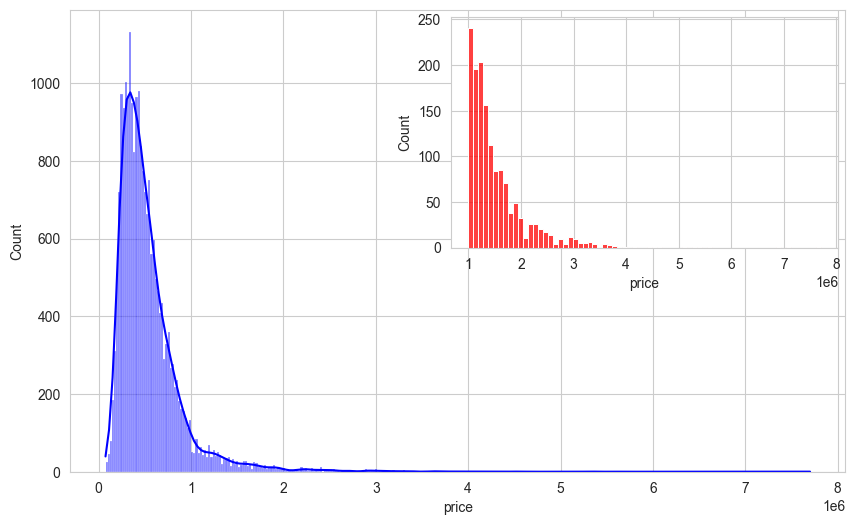

In [18]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig, ax = plt.subplots(figsize=(10, 6))

# Create the original histogram
sns.histplot(df["price"], kde=True, color="b", ax=ax)

# Create the inset axes
axins = inset_axes(ax, width="50%", height="50%", loc="upper right")

# Create the zoomed histogram on the inset axes
sns.histplot(df[df["price"] > 1000000], x="price", color="r", ax=axins)
# axins.set_xlim(0, 5000)
# axins.set_ylim(0, 1000)

plt.show()

# The histograms the distribution of house prices in millions
# Although most houses cost around 500K, there are many that cost over 1M and could be as expensive as over 7M

In [19]:
# List of most expensive houses with prices over 3M
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7252,20141013T000000,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3914,20140611T000000,7062500.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9254,20140919T000000,6885000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4411,20140804T000000,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1448,20150413T000000,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1315,20150413T000000,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1164,20141020T000000,5110800.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8092,20140617T000000,4668000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2626,20140815T000000,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8638,20140618T000000,4489000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


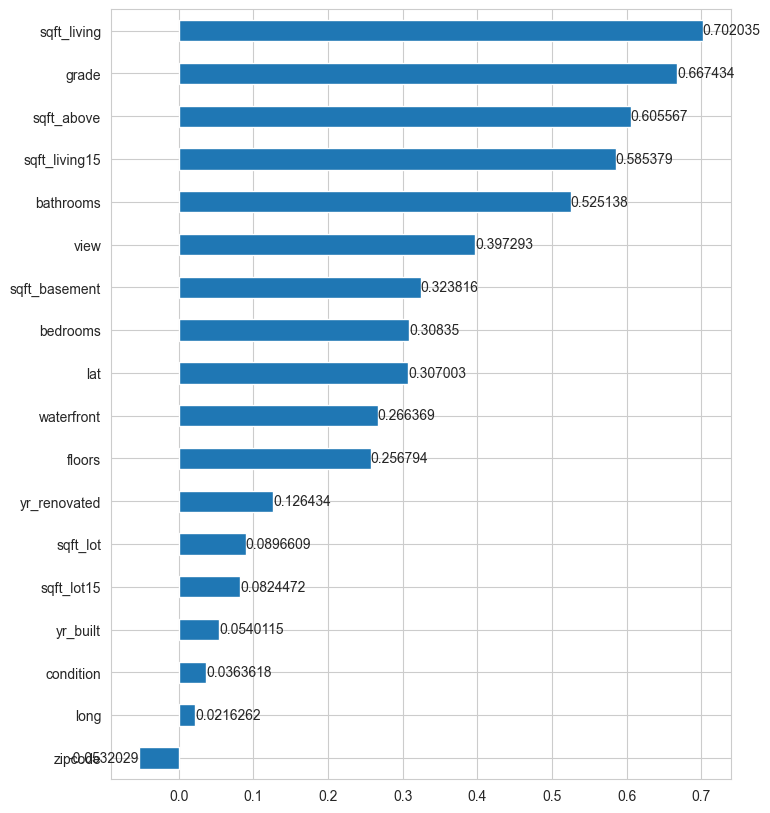

In [20]:
plt.figure(figsize=(8, 10))

# Plot the correlation matrix for the numeric values of all columns in df with the price column 
# then drop the price column to focus on its relationship with other columns
ax = df.corr(numeric_only=True)["price"].sort_values().drop("price").plot(kind="barh")
ax.bar_label(ax.containers[0])
plt.show()

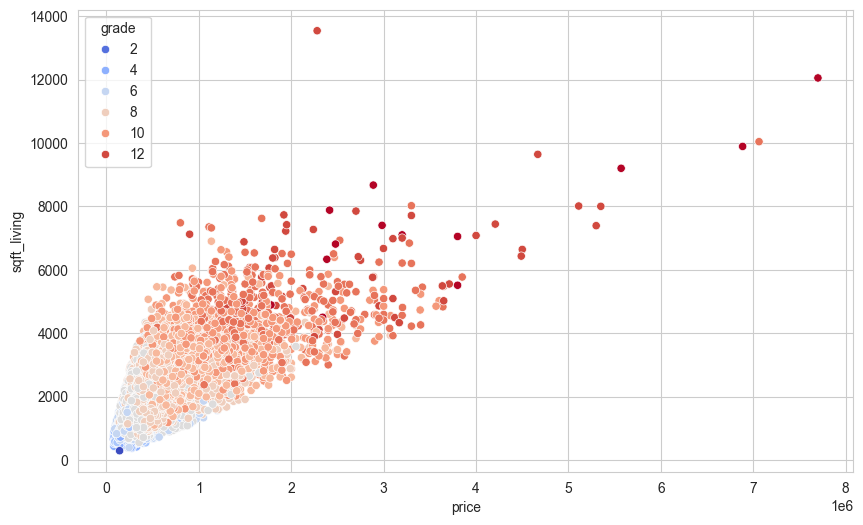

In [21]:
# The relationship between price vs sqft_living
sns.scatterplot(x="price", y="sqft_living", data=df, hue="grade", palette="coolwarm")
plt.show()

### bedrooms

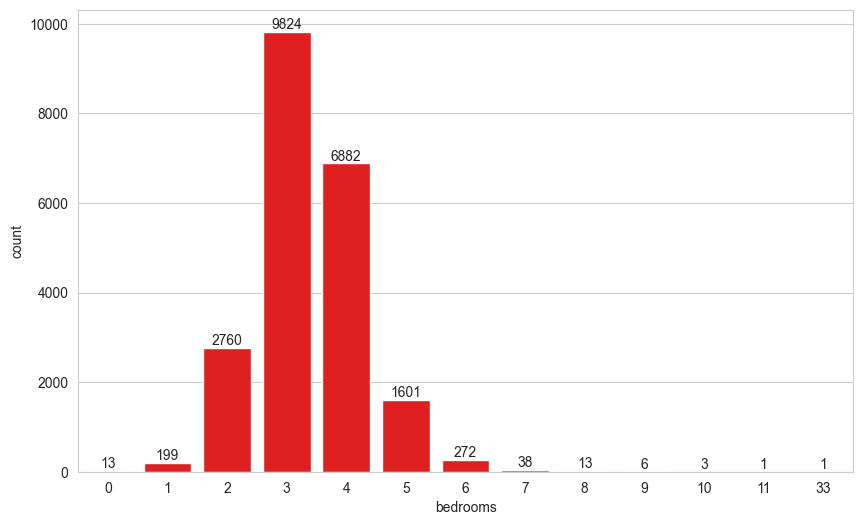

In [22]:
# The number of bedrooms in a house
ax = sns.countplot(x=df["bedrooms"], color="r")
ax.bar_label(ax.containers[0])
plt.show()

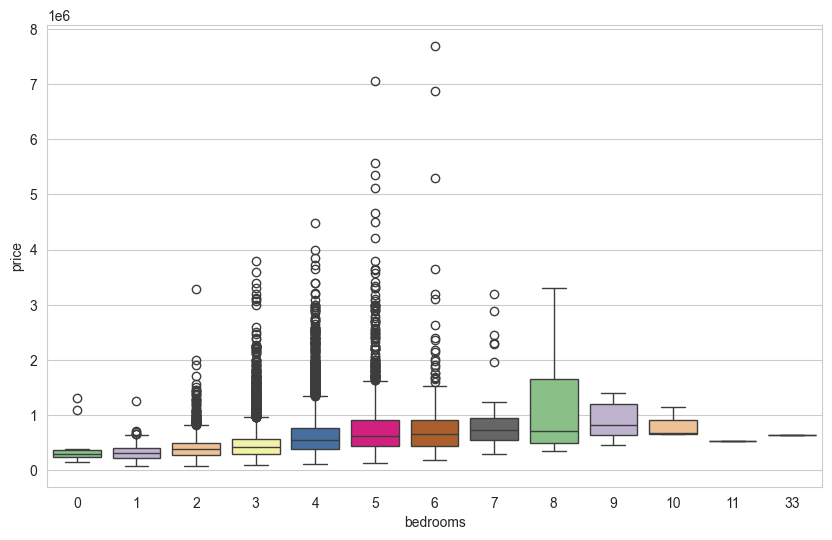

In [23]:
# The number of bedrooms vs range of house prices
sns.boxplot(x="bedrooms", y="price", data=df, palette="Accent")
plt.show()

In [24]:
# Checking for anormalies

# The data of the houses with > 10 bedrooms
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8757,20140821T000000,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15870,20140625T000000,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [25]:
# It seems the house with 33 bedrooms is false data
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [26]:
# Checking the shape of our housing data
df.shape

(21612, 20)

### date

In [27]:
# Check the datatype of the 'date' column - It's an object
df["date"].dtype

dtype('O')

In [28]:
# Convert the date datatype to 'date'
df["date"] = pd.to_datetime(df["date"])

In [29]:
df["date"]

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21608   2014-05-21
21609   2015-02-23
21610   2014-06-23
21611   2015-01-16
21612   2014-10-15
Name: date, Length: 21612, dtype: datetime64[ns]

In [30]:
# Here the year is extracted from the date data and is assigned to a new column of its own called 'year'
df["year"] = df["date"].dt.year
# df['year'] = df['date'].apply(lambda date: date.year)
# Avoid using the apply method as it is almost 14x slower.

In [31]:
# `%%timeit`` is a magic command in Jupyter Notebook or IPython that is used to measure the execution time of a block of code. 
# It runs the code multiple times and provides the average time taken, along with the standard deviation, to give you a reliable 
# estimate of the code's performance.

%%timeit
df["date"].dt.year

UsageError: Line magic function `%%timeit` not found.


In [ ]:
%%timeit
df["date"].apply(lambda date: date.year)

6.08 ms ± 69.7 μs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [ ]:
df

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,2014-05-21,360000.000,3,2.500,1530,1131,3.000,0,0,3,8,1530,0,2009,0,98103,47.699,-122.346,1530,1509,2014
21609,2015-02-23,400000.000,4,2.500,2310,5813,2.000,0,0,3,8,2310,0,2014,0,98146,47.511,-122.362,1830,7200,2015
21610,2014-06-23,402101.000,2,0.750,1020,1350,2.000,0,0,3,7,1020,0,2009,0,98144,47.594,-122.299,1020,2007,2014
21611,2015-01-16,400000.000,3,2.500,1600,2388,2.000,0,0,3,8,1600,0,2004,0,98027,47.535,-122.069,1410,1287,2015


In [ ]:
df.year.nunique()

2

In [ ]:
# Extract the month data from date and assign it to a new column
df["month"] = df["date"].dt.month

In [ ]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


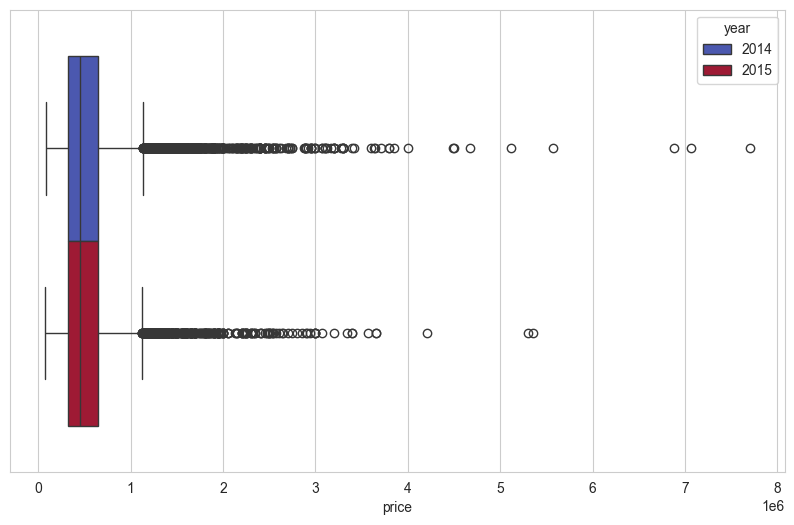

In [ ]:
# Examining the relationship between price vs year
sns.boxplot(x="price", hue="year", data=df, palette="coolwarm")
plt.show()

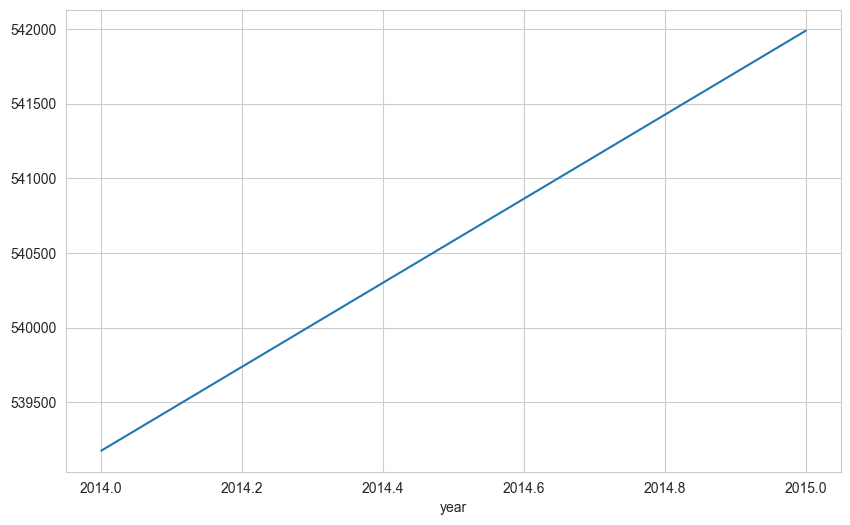

In [ ]:
df.groupby("year")["price"].mean().plot()
plt.show()

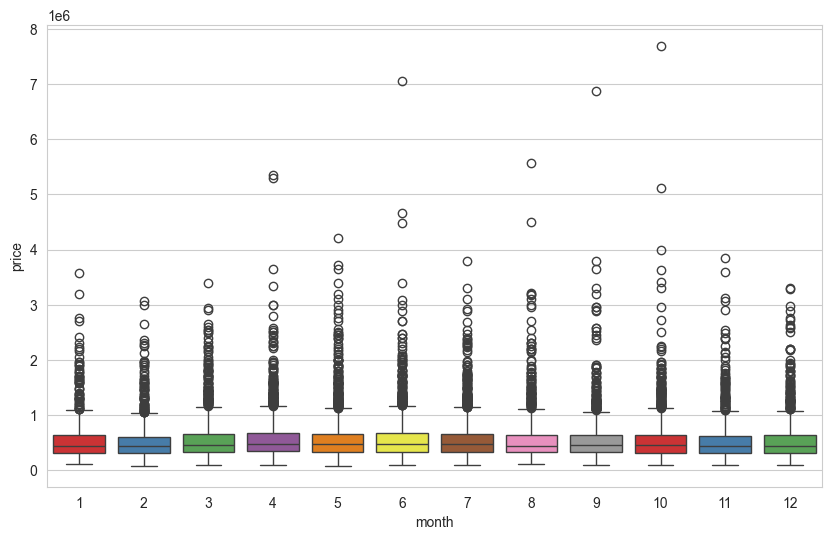

In [ ]:
sns.boxplot(x="month", y="price", data=df, palette="Set1")
plt.show()

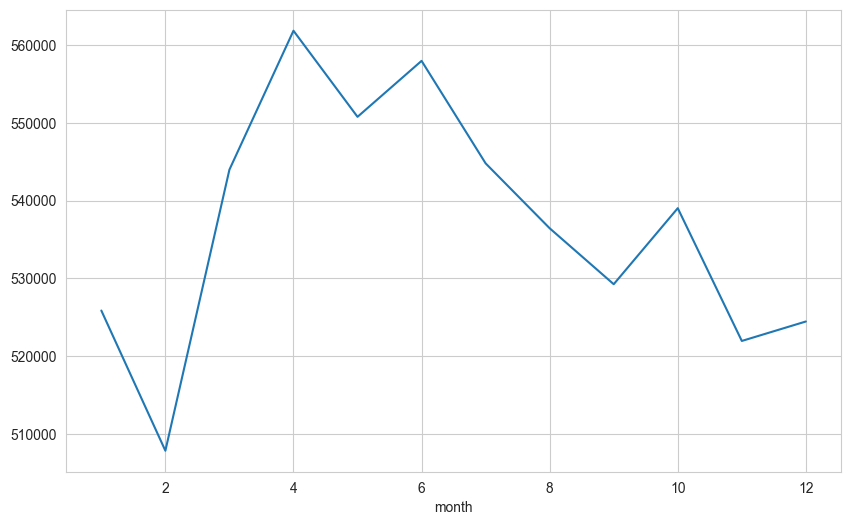

In [ ]:
df.groupby("month")["price"].mean().plot()
plt.show()

In [ ]:
df = df.drop(["date", "year", "month"], axis=1)

### zipcode

In [ ]:
df["zipcode"].value_counts(dropna=False)

zipcode
98103    601
98038    590
98115    583
98052    574
98117    553
        ... 
98102    105
98010    100
98024     81
98148     57
98039     50
Name: count, Length: 70, dtype: int64

If you want to keep zipcodes, look into [hash encoding](https://medium.com/flutter-community/dealing-with-categorical-features-with-high-cardinality-feature-hashing-7c406ff867cb).

In [ ]:
df = df.drop("zipcode", axis=1)

### yr_renovated & yr_built

In [ ]:
df["yr_renovated"].value_counts(dropna=False)

yr_renovated
0       20698
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: count, Length: 70, dtype: int64

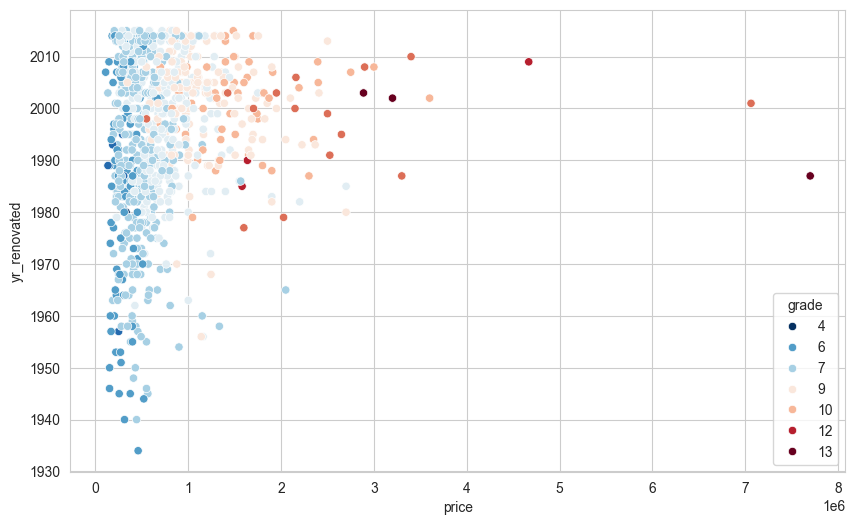

In [ ]:
sns.scatterplot(x="price", y="yr_renovated", data=df[df.yr_renovated != 0], hue="grade", palette="RdBu_r")
plt.show()

In [ ]:
df["yr_built"].value_counts(dropna=False)

yr_built
2014    559
2006    454
2005    450
2004    433
2003    422
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: count, Length: 116, dtype: int64

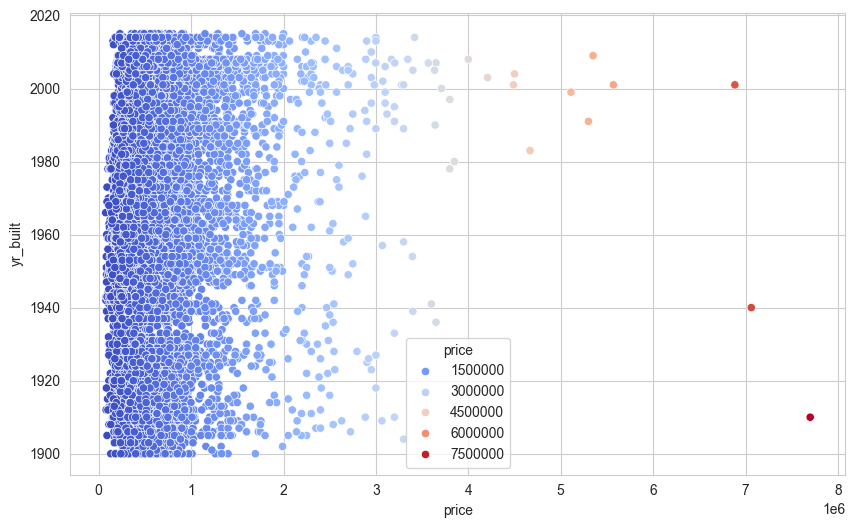

In [ ]:
sns.scatterplot(x="price", y="yr_built", hue="price", data=df, palette="coolwarm")
plt.show()


In [ ]:
df.yr_renovated.apply(lambda x: x if x == 0 else 1).value_counts()

yr_renovated
0    20698
1      914
Name: count, dtype: int64

In [ ]:
df["renovated"] = df.yr_renovated.apply(lambda x: x if x == 0 else 1)

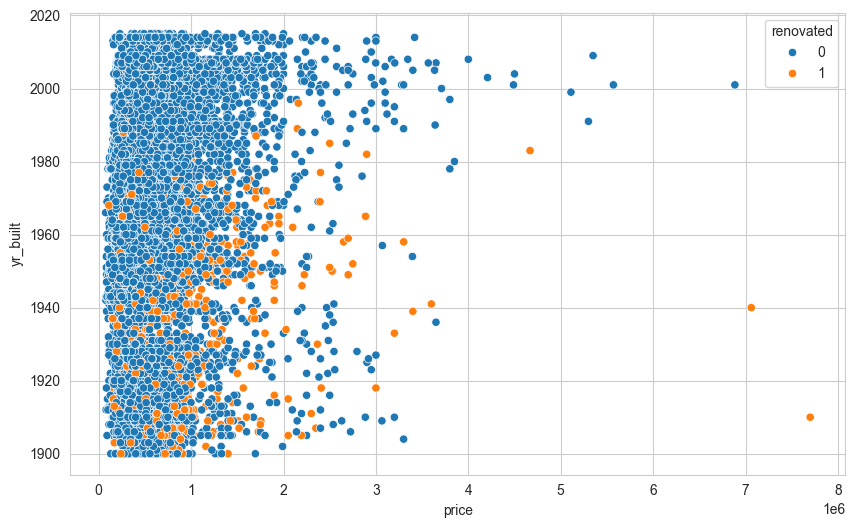

In [ ]:
sns.scatterplot(x="price", y="yr_built", data=df, hue="renovated")
plt.show()

In [ ]:
df["built|renovated"] = df["yr_renovated"].replace(0, np.nan).fillna(df["yr_built"])
df["built|renovated"]

0       1955.000
1       1991.000
2       1933.000
3       1965.000
4       1987.000
          ...   
21608   2009.000
21609   2014.000
21610   2009.000
21611   2004.000
21612   2008.000
Name: built|renovated, Length: 21612, dtype: float64

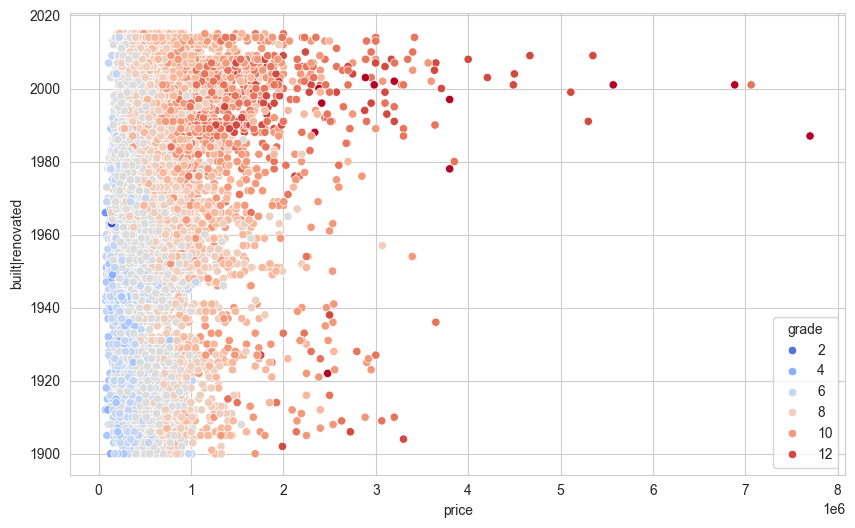

In [ ]:
sns.scatterplot(x="price", y="built|renovated", data=df, hue="grade", palette="coolwarm")
plt.show()

In [ ]:
df.drop(["yr_renovated", "yr_built", "renovated"], axis=1, inplace=True)

### sqft_basement

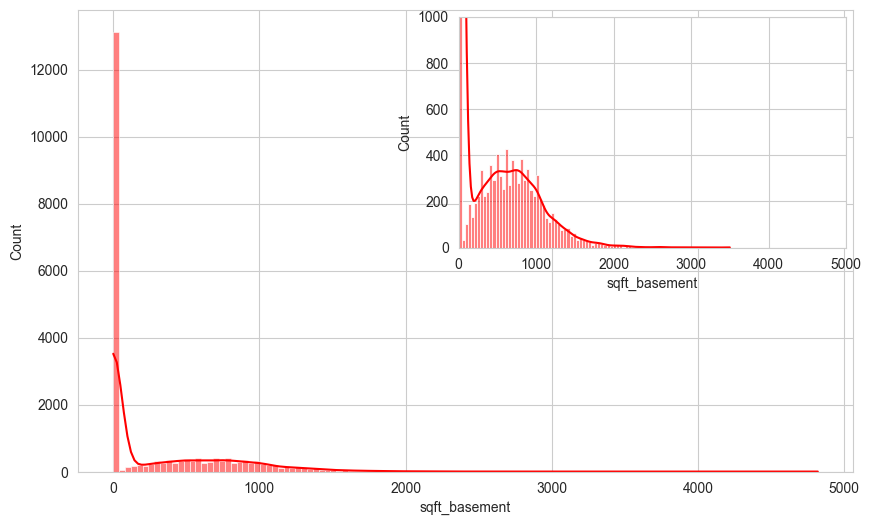

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))

# Create the original histogram
sns.histplot(df["sqft_basement"], kde=True, color="r", ax=ax)

# Create the inset axes
axins = inset_axes(ax, width="50%", height="50%", loc="upper right")

# Create the zoomed histogram on the inset axes
sns.histplot(df[df["sqft_basement"] < 4000], x="sqft_basement", kde=True, color="r", ax=axins)
axins.set_xlim(0, 5000)
axins.set_ylim(0, 1000)

plt.show()


In [ ]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
8092,4668000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,47.557,-122.210,3270,10454,2009.000
12777,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
15482,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,47.593,-122.086,4913,14663,1991.000
7252,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
10085,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,47.576,-122.242,4480,16471,1980.000


### sqft_above

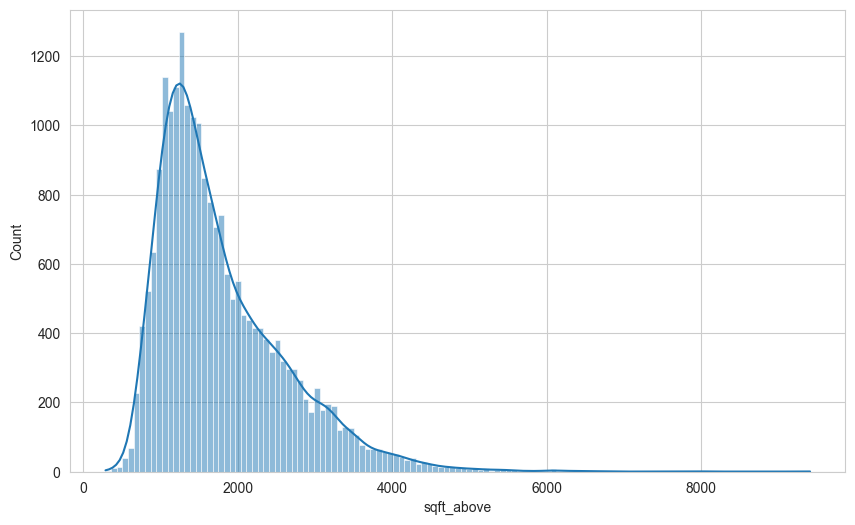

In [ ]:
sns.histplot(df["sqft_above"], kde=True)
plt.show()

In [ ]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
12777,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
9254,6885000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
7252,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
18302,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,47.568,-122.189,4160,18969,2001.000
13411,2415000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,47.733,-122.362,2740,10761,1996.000
19858,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,47.541,-121.982,6210,95832,2006.000
3914,7062500.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
11871,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,47.455,-121.764,5610,169549,2002.000
18594,1135250.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,47.447,-122.086,3270,34500,1992.000
1448,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000


### Geographical Properties

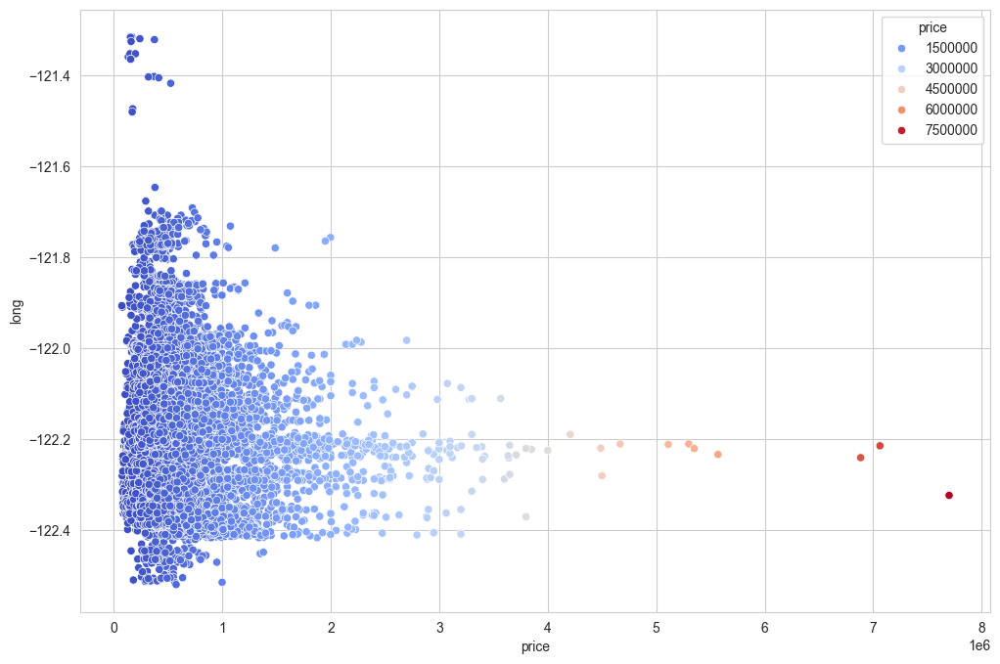

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x="price", y="long", hue="price", data=df, palette="coolwarm")
plt.show()

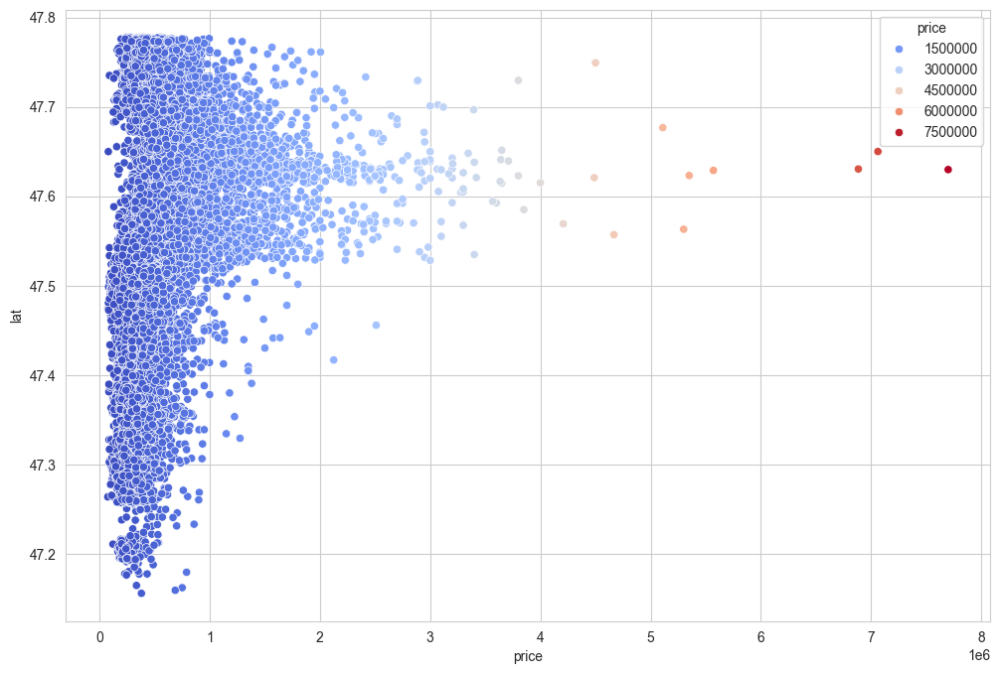

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x="price", y="lat", hue="price", data=df, palette="coolwarm")
plt.show()

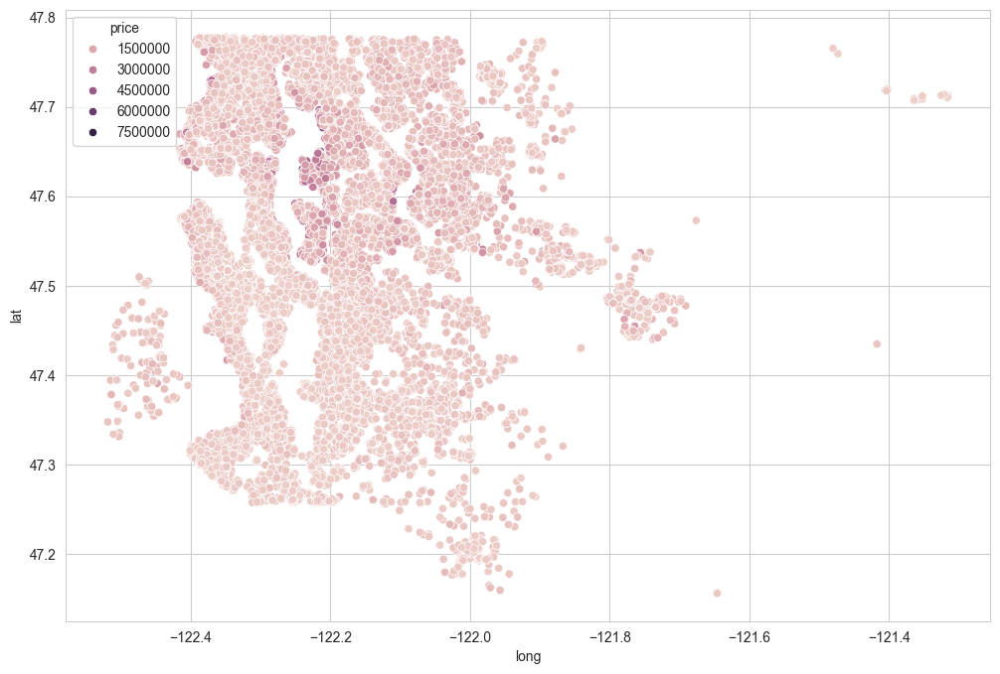

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x="long", y="lat", data=df, hue="price")
plt.show()

In [ ]:
# We will exclude the top 1% of most expensive houses from our visualisation.
len(df) * (0.01)

216.12

In [ ]:
df.sort_values("price", ascending=False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
7252,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
3914,7062500.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
9254,6885000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
4411,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,2001.000
1448,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19529,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,47.638,-122.219,2180,10800,2007.000
16525,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,47.632,-122.192,2540,26287,1990.000
7415,1975000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,47.626,-122.291,2180,6037,2007.000
17235,1970000.000,8,3.500,4440,6480,2.000,0,3,5,10,3140,1300,47.631,-122.303,4440,8640,1959.000


In [ ]:
non_top_1_perc = df.sort_values("price", ascending=False).iloc[216:]

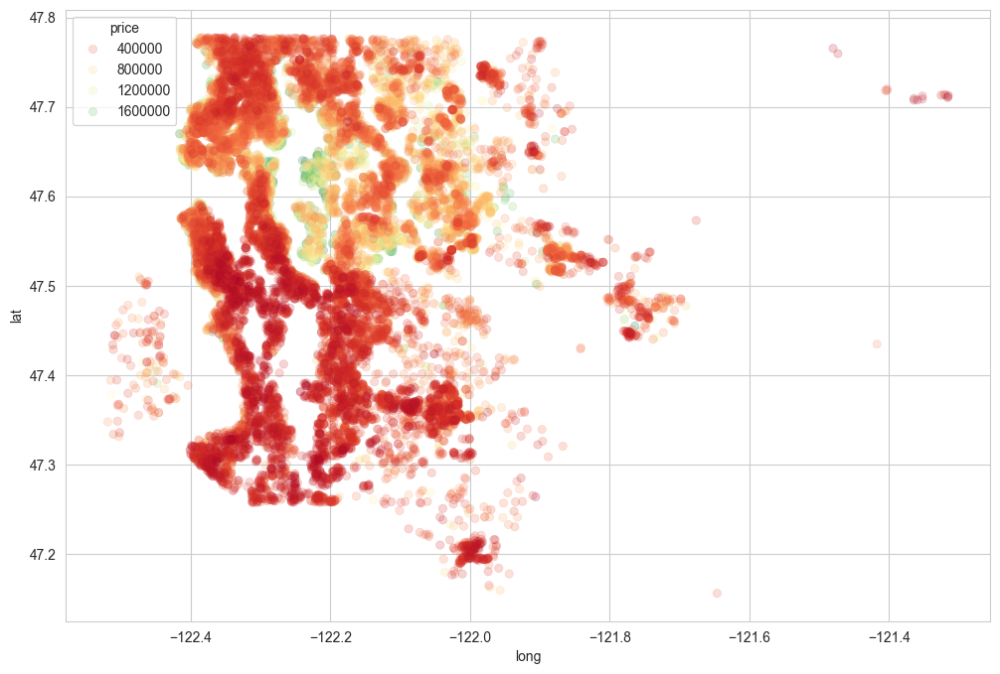

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="long",
    y="lat",
    data=non_top_1_perc,
    hue="price",
    palette="RdYlGn",
    edgecolor=None,
    alpha=0.2,
)
plt.show()

In [ ]:
import folium
import branca.colormap as cm  # used for change colour

In [ ]:
# The default location for our map is the mean valus of the "lat" and "long" values.
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [ ]:
# Creating bins for price ranges to derive colours off of.
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

In [ ]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)
colormap = cm.StepColormap(
    colors=["red", "orange", "yellow", "green"],
    index=[step_1, step_2, step_3, step_4, step_5],
    vmin=step_1,
    vmax=step_5,
)
for loc, p in zip(zip(df["lat"], df["long"]), df["price"]):
    folium.Circle(location=loc, radius=1, fill=True, color=colormap(p)).add_to(m)
m

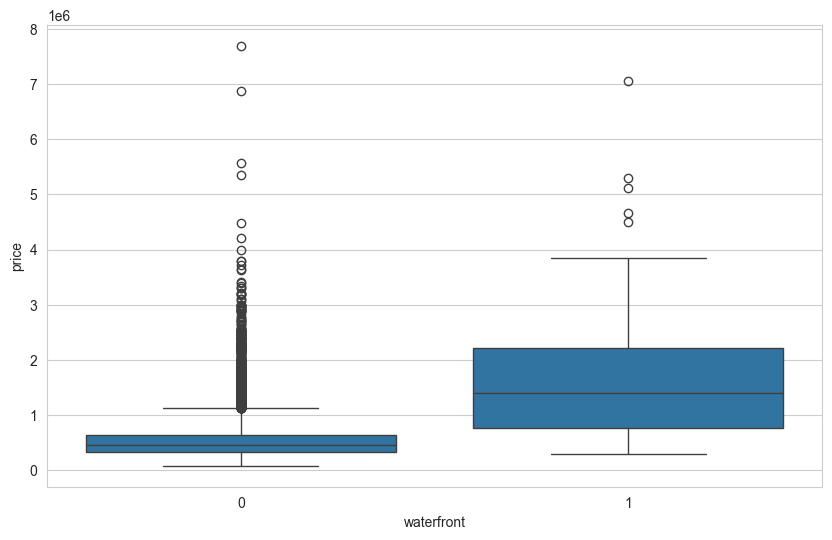

In [ ]:
sns.boxplot(x="waterfront", y="price", data=df)
plt.show()

In [ ]:
df.groupby("waterfront").price.mean()

waterfront
0    531558.544
1   1661876.025
Name: price, dtype: float64

### latest data

In [ ]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,47.721,-122.319,1690,7639,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,47.738,-122.233,2720,8062,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,47.521,-122.393,1360,5000,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,47.617,-122.045,1800,7503,1987.000


In [ ]:
df.shape

(21612, 17)

## Preprocessing of Data
- Train | Test Split, Scalling

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X = df.drop("price", axis=1)
y = df["price"]

In [ ]:
import os

seed = 101
# "TF_DETERMINISTIC_OPS" to "1". This is a TensorFlow feature that, when a random seed is set,
# makes the operations deterministic (i.e., less random). This can also help with reproducibility.
os.environ["TF_DETERMINISTIC_OPS"] = "1"
# 'tf.keras.utils.set_random_seed' is a function that sets the random seed for TensorFlow.
# Here, we're using the seed value we set earlier. This means that the randomness
# in any TensorFlow operations will be determined by this seed, and so will be reproducible.
tf.keras.utils.set_random_seed(seed)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=seed
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.15, random_state=seed
)

In [ ]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [ ]:
scaler = MinMaxScaler()

In [ ]:
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [ ]:
!pip install livelossplot

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from livelossplot import PlotLossesKerasTF

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

In [ ]:
def eval_metric(actual, pred):
    """Prints regression metrics, calculated using the given
    actual and predicted target values.
    Args:
        actual (list): Actual target values.
        pred (list): Predicted target values.
    Returns:
        None
    """
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mape = mean_absolute_percentage_error(actual, pred)
    score = r2_score(actual, pred)
    print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse, "\nmape:", mape)

In [ ]:
X_train.shape

(16532, 16)

In [ ]:
model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
# model.add(Activation("relu"))
# Activation function can be added separately
# as a different line after each layer.
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

model.compile(optimizer="adam", loss="mean_squared_error")

In [ ]:
# if you want to see the summary of the architecture before the fit process, you must define the input_dim
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 24)             │           408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 24)             │           600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 12)             │           300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │            78 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │             7 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,393 (5.44 KB)

 Trainable params: 1,393 (5.44 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# To display weights and biases of each layer
for i, weight in enumerate(model.weights):
    print(f"Weight {i}:")
    print(weight.numpy(), "\n")

Weight 0:
[[-0.35647073  0.38490498 -0.08744469  0.15377373  0.22215843 -0.02771163
   0.11982757 -0.35179138 -0.22738509 -0.01394773  0.37500745  0.17092556
  -0.33209184  0.32572126  0.04000178  0.28462964 -0.04399332  0.19303006
   0.24007684 -0.07156605 -0.07338411 -0.26527756 -0.10138947 -0.12765884]
 [ 0.20285243  0.1625874   0.09493753  0.210621   -0.3477749   0.04268652
   0.24083078 -0.3537471  -0.37514928  0.31485617 -0.10756519  0.02557248
   0.0060361   0.10938206 -0.04046023  0.38605756  0.05352944  0.2004916
   0.16421968 -0.09854421  0.27363658  0.14958262 -0.26525187 -0.17038073]
 [-0.14781646  0.22237402 -0.25978014 -0.08758965 -0.01525185 -0.27800336
   0.36590946 -0.04418713  0.21475899 -0.20625347 -0.21336366 -0.06695104
  -0.19746223 -0.03350914  0.27873516  0.07029167 -0.19808385 -0.05061477
   0.11886674  0.25072682 -0.36691827 -0.36778718 -0.05691609  0.14560783]
 [-0.13458556  0.23913866  0.05025178 -0.35281578 -0.2878821  -0.27039498
   0.33782828  0.10401911 

In [ ]:
epoch = 1000
batch_size = 128
patience = 25
lr = 0.003

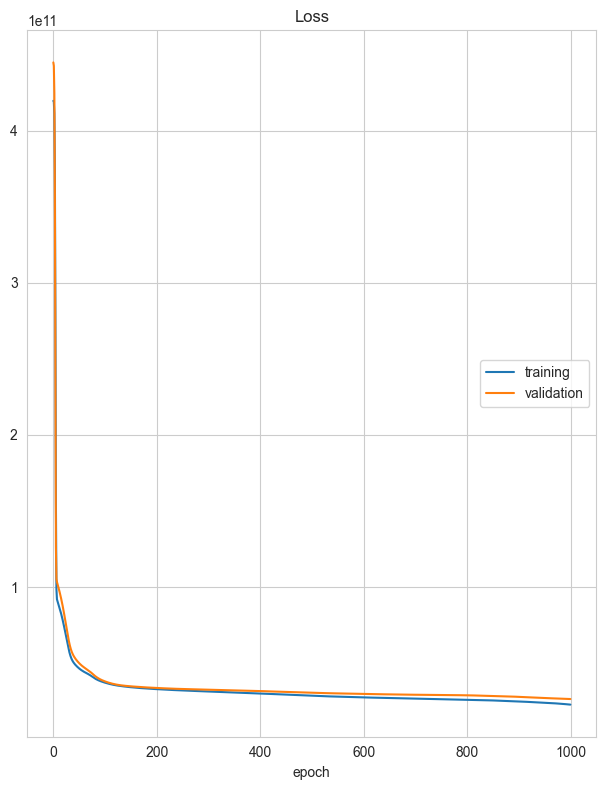

Loss
	training         	 (min: 22833901568.000, max: 419491676160.000, cur: 22833901568.000)
	validation       	 (min: 26505969664.000, max: 444727590912.000, cur: 26505969664.000)
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 22687334400.0000 - val_loss: 26505969664.0000


In [ ]:
# placing the model specifically on the GPU is usually unnecessary because it is done automatically
with tf.device('/GPU:0'):
  model.fit(x=X_train,
          y=y_train,
          validation_data=(X_val, y_val),
          batch_size=batch_size,
          epochs=epoch,
          callbacks=[PlotLossesKerasTF()])

In [ ]:
# To display weights and biases of each layer
for i, weight in enumerate(model.weights):
    print(f"Weight {i}:")
    print(weight.numpy(), "\n")

Weight 0:
[[-1.52305639e+00 -2.89081365e-01 -7.64753640e-01  9.96045172e-02
  -1.14682543e+00 -2.77116299e-02 -1.36888370e-01 -8.21112394e-01
  -1.07982349e+00 -2.50147343e-01 -3.75978470e-01  2.05520242e-01
  -1.75587928e+00 -4.12823528e-01 -1.45650339e+00 -1.01673591e+00
  -4.39933240e-02 -6.74924791e-01 -9.26505685e-01 -1.48935425e+00
  -1.17387557e+00 -3.73953104e-01 -4.25593019e-01 -1.93977773e-01]
 [ 8.30376685e-01  7.29301453e-01 -9.19924006e-02  1.05420254e-01
   7.34998524e-01  4.26865220e-02  6.73845649e-01 -1.78149134e-01
  -6.06884621e-03  7.44293630e-01  2.60229945e+00 -3.30177665e-01
   8.47102404e-01  5.64975917e-01  1.32100296e+00 -4.46281761e-01
   5.35294414e-02  7.02352107e-01  4.98087198e-01  1.18953156e+00
   1.52819538e+00  3.53116654e-02  1.33724019e-01 -2.33406901e-01]
 [ 1.63113260e+00  2.81207442e+00  2.08275795e+00  1.58407032e+00
   3.69909286e+00 -2.78003365e-01  2.44836187e+00  2.16124845e+00
   2.36260724e+00  1.84572613e+00  2.78714824e+00  1.31133759e+0

In [ ]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,419491676160.000,444727590912.000
1,418823897088.000,442473775104.000
2,410974224384.000,424408285184.000
3,373681324032.000,358932676608.000
4,278770810880.000,231386333184.000
...,...,...
995,22962964480.000,26562064384.000
996,22931159040.000,26543835136.000
997,22899341312.000,26536519680.000
998,22866395136.000,26515331072.000


<Axes: >

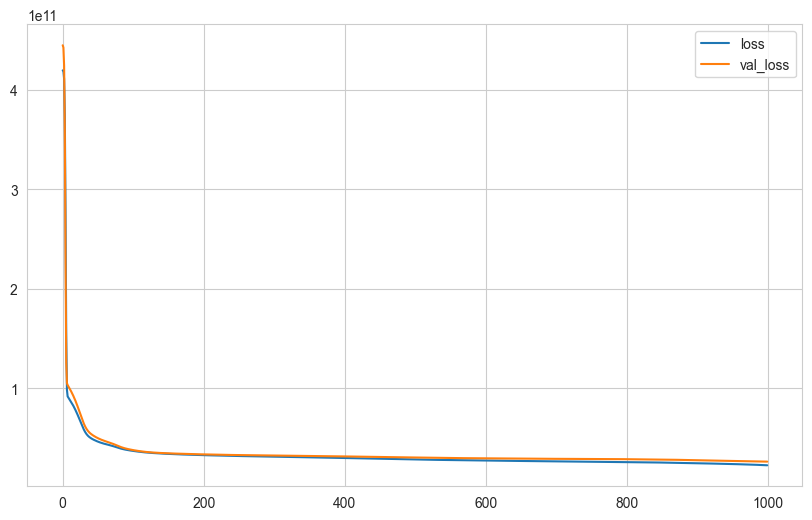

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
model.evaluate(X_test, y_test, verbose=0)

2025-02-20 15:12:17.459171: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_15}}
2025-02-20 15:12:17.459416: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),

22849714176.0

In [ ]:
y_pred = model.predict(X_test)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step


In [ ]:
eval_metric(y_test, y_pred)

r2_score: 0.8511748173354993 
mae: 90101.09463170676 
mse: 22849716141.941402 
rmse: 151161.22565638783 
mape: 0.1642935137593259


### learning_rate

In [ ]:
from tensorflow.keras.optimizers import Adam

In [ ]:
model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

opt = Adam(learning_rate=lr)  # default learning rate value is 0.001
model.compile(optimizer=opt, loss="mean_squared_error")

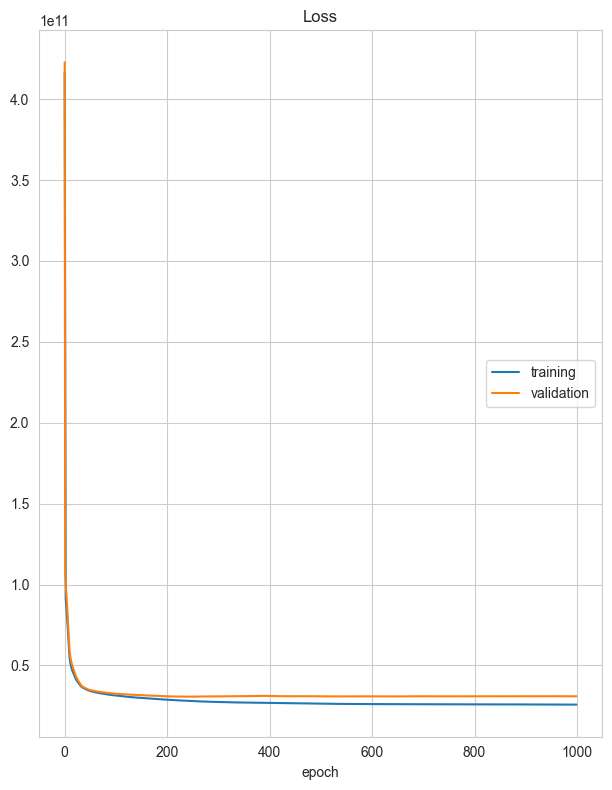

Loss
	training         	 (min: 25755981824.000, max: 416440877056.000, cur: 25757464576.000)
	validation       	 (min: 30659227648.000, max: 422722142208.000, cur: 30905976832.000)
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 25428041728.0000 - val_loss: 30905976832.0000


In [ ]:
model.fit(x=X_train,
          y=y_train,
          validation_data=(X_val, y_val),
          batch_size=batch_size,
          epochs=epoch,
          callbacks=[PlotLossesKerasTF()])

<Axes: >

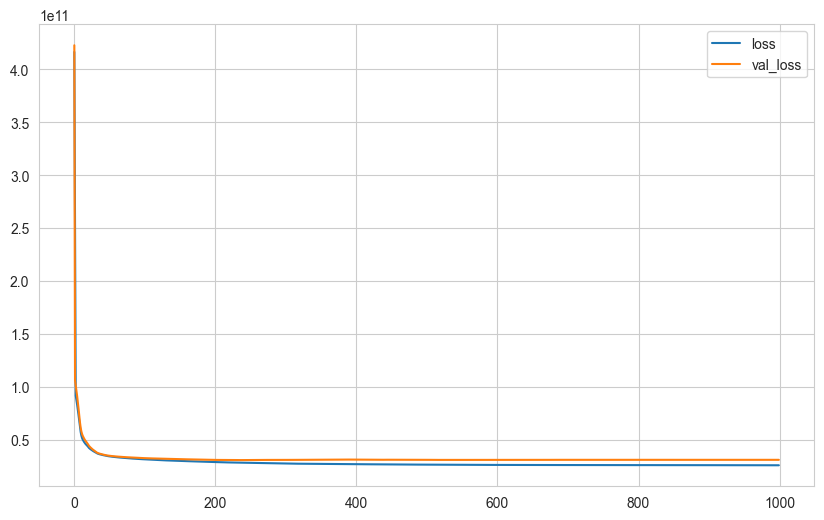

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
y_pred = model.predict(X_test)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 502us/step


2025-02-20 15:14:29.139898: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}
2025-02-20 15:14:29.140169: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),

In [ ]:
eval_metric(y_test, y_pred)

r2_score: 0.8335816758522085 
mae: 99845.27460106384 
mse: 25550860408.933083 
rmse: 159846.36501632773 
mape: 0.18435114890113505


### EarlyStopping

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

opt = Adam(learning_rate=0.003)
model.compile(optimizer=opt, loss="mean_squared_error")

In [ ]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=patience, restore_best_weights=True
)

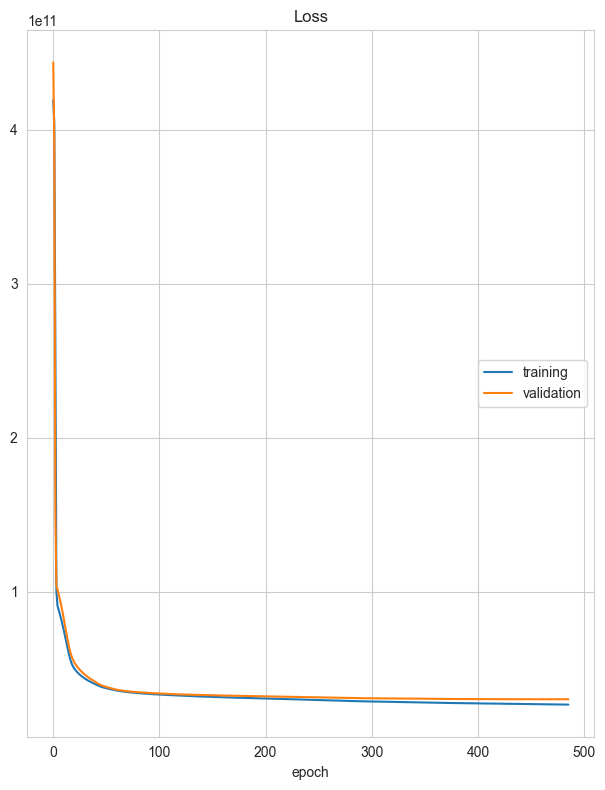

Loss
	training         	 (min: 26628872192.000, max: 419350544384.000, cur: 26628872192.000)
	validation       	 (min: 30104782848.000, max: 443721973760.000, cur: 30139783168.000)
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 26469308416.0000 - val_loss: 30139783168.0000
Epoch 486: early stopping
Restoring model weights from the end of the best epoch: 461.


In [ ]:
model.fit(
    x=X_train,
    y=y_train,
    validation_data=(X_val, y_val),
    batch_size=batch_size,
    epochs=epoch,
    callbacks=[early_stop, PlotLossesKerasTF()],
)

<Axes: >

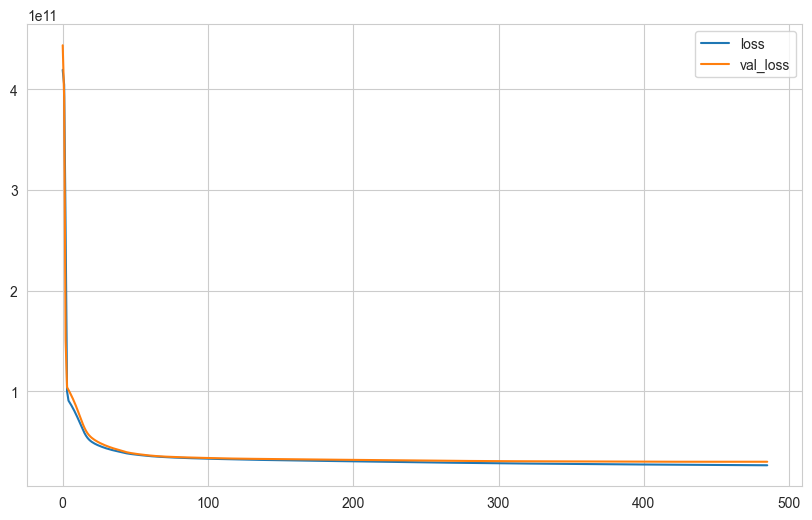

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
y_pred = model.predict(X_test)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 469us/step


2025-02-20 15:15:31.768671: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}
2025-02-20 15:15:31.768960: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),

In [ ]:
eval_metric(y_test, y_pred)

r2_score: 0.8315020701254139 
mae: 99803.81276017576 
mse: 25870150462.495712 
rmse: 160842.0046582848 
mape: 0.18340030072967958


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

Dropout refers to ignoring units (i.e. neurons) during the training phase of certain set of neurons which is chosen at random. By “ignoring”, I mean these units are not considered during a particular forward or backward pass.

For each hidden layer, for each training sample, for each iteration, ignore (zero out) a random fraction, p, of nodes (and corresponding activations).

![dropout.PNG](https://miro.medium.com/max/1400/1*nty4xtm9UBuWLqxHVaamjw.png)
[Source-1](https://medium.com/@amarbudhiraja/https-medium-com-amarbudhiraja-learning-less-to-learn-better-dropout-in-deep-machine-learning-74334da4bfc5)
[Source-2](https://medium.com/unpackai/introduction-of-dropout-and-ensemble-model-in-the-history-of-deep-learning-a4c2a512dcca)

In [ ]:
from tensorflow.keras.layers import Dropout

In [ ]:
# tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(24, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(12, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(6, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(learning_rate=0.003)
model.compile(optimizer=opt, loss="mean_squared_error")

In [ ]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=patience, restore_best_weights=True
)

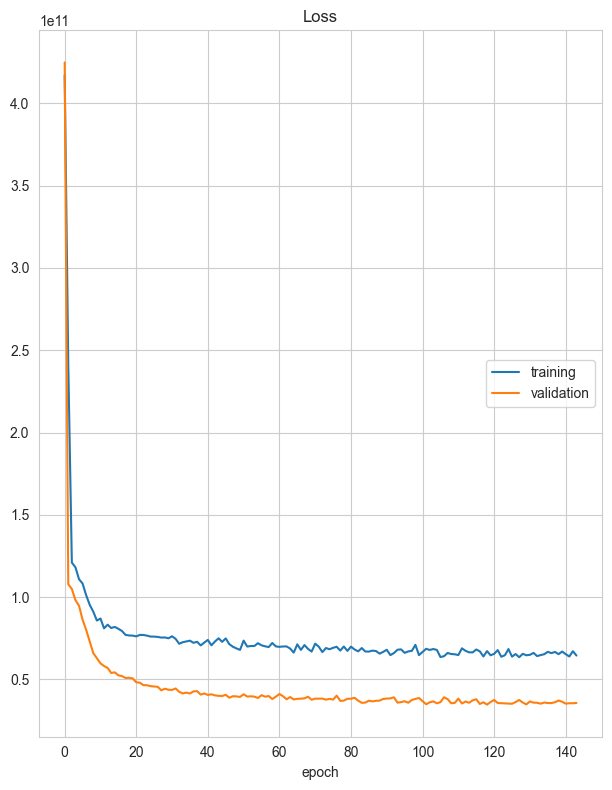

Loss
	training         	 (min: 63414562816.000, max: 417085194240.000, cur: 64441311232.000)
	validation       	 (min: 34606202880.000, max: 424947089408.000, cur: 35616358400.000)
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 65821274112.0000 - val_loss: 35616358400.0000
Epoch 144: early stopping
Restoring model weights from the end of the best epoch: 119.


In [ ]:
model.fit(
    x=X_train,
    y=y_train,
    validation_data=(X_val, y_val),
    batch_size=batch_size,
    epochs=epoch,
    callbacks=[early_stop, PlotLossesKerasTF()],
)

<Axes: >

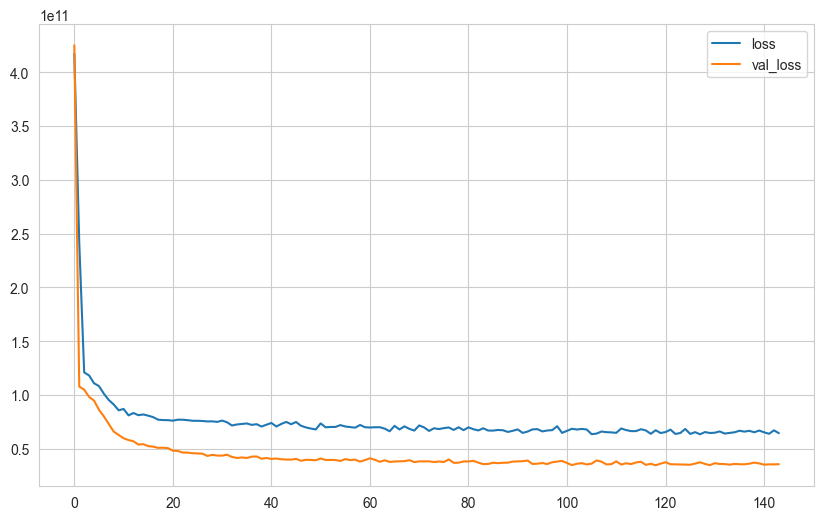

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
y_pred = model.predict(X_test)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 492us/step


2025-02-20 15:15:52.119513: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}
2025-02-20 15:15:52.119813: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),

In [ ]:
eval_metric(y_test, y_pred)

r2_score: 0.7698455573259599 
mae: 109736.59815130667 
mse: 35336517582.2691 
rmse: 187980.09889950877 
mape: 0.18718087116201762


## Saving Final Model and Scaler

In [ ]:
import pickle

pickle.dump(scaler, open("scaler_kc_house", "wb"))

In [ ]:
# tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

opt = Adam(learning_rate=0.003)
model.compile(optimizer=opt, loss="mean_squared_error")

In [ ]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=100, restore_best_weights=True
)

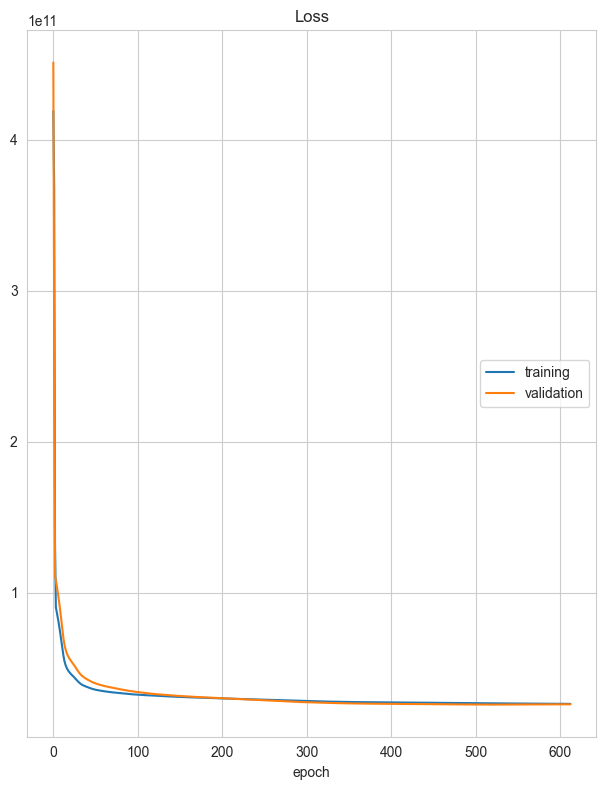

Loss
	training         	 (min: 26428170240.000, max: 418954280960.000, cur: 26428891136.000)
	validation       	 (min: 25937920000.000, max: 451130720256.000, cur: 26138779648.000)
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 26187278336.0000 - val_loss: 26138779648.0000
Epoch 613: early stopping
Restoring model weights from the end of the best epoch: 513.


In [ ]:
model.fit(
    x=X_train,
    y=y_train,
    validation_data=(X_test, y_test),
    batch_size=128,
    epochs=1500,
    callbacks=[early_stop, PlotLossesKerasTF()],
)

<Axes: >

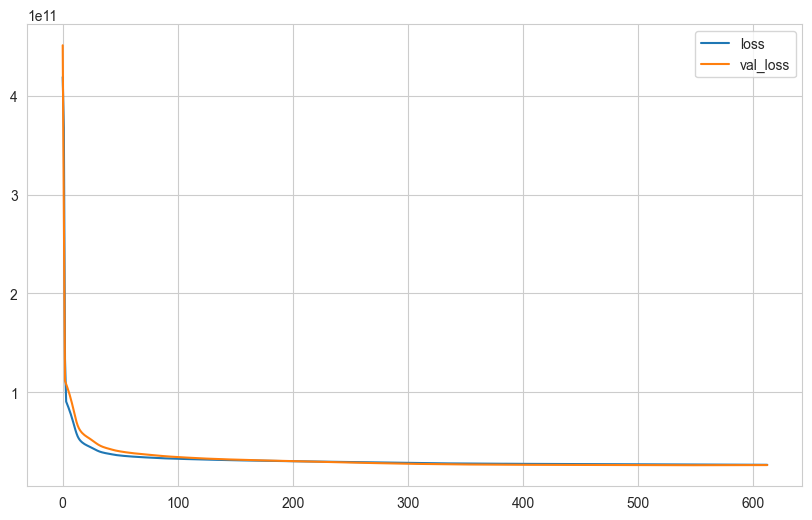

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
y_pred = model.predict(X_test)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step


2025-02-20 15:17:10.720203: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}
2025-02-20 15:17:10.720470: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),

In [ ]:
eval_metric(y_test, y_pred)

r2_score: 0.8310606681372199 
mae: 100738.45847305736 
mse: 25937920647.31353 
rmse: 161052.5400213034 
mape: 0.1861633292224054


In [ ]:
model.save("model_kc_house.keras")  # creates a HDF5 file 'my_model.h5'

## Loading Model and Scaler

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
model_kc_house = load_model("model_kc_house.keras")
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [ ]:
single_house = df.drop("price", axis=1).iloc[[0], :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000


In [ ]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.27272727, 0.125     , 0.06716981, 0.00310751, 0.        ,
        0.        , 0.        , 0.5       , 0.5       , 0.09758772,
        0.        , 0.56711082, 0.21760797, 0.16193426, 0.00574235,
        0.47826087]])

In [ ]:
model_kc_house.predict(single_house)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


array([[285282.66]], dtype=float32)

In [ ]:
df.iloc[0][0]

np.float64(221900.0)

## Comparison with ML

### Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)

# Prediction
y_pred = ln_model.predict(X_test)
y_pred_train = ln_model.predict(X_train)

# Evaluation
eval_metric(y_test, y_pred)
print("-*" * 15)
eval_metric(y_train, y_pred_train)

r2_score: 0.6845110985266353 
mae: 126216.97478466986 
mse: 48438252959.18031 
rmse: 220086.92137239847 
mape: 0.24453096282260636
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
r2_score: 0.6823273254515039 
mae: 127791.46133008826 
mse: 41381871212.61262 
rmse: 203425.34555116924 
mape: 0.2580617329818387


### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf_model = RandomForestRegressor(random_state=seed)
rf_model.fit(X_train, y_train)

# Predict
y_pred = rf_model.predict(X_test)
y_pred_train = rf_model.predict(X_train)

# Evaluate
eval_metric(y_test, y_pred)
print("-*" * 15)
eval_metric(y_train, y_pred_train)

r2_score: 0.8931118556962885 
mae: 68712.39247202766 
mse: 16410957558.066935 
rmse: 128105.25968150931 
mape: 0.1250598672849234
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
r2_score: 0.9816171402505441 
mae: 26390.147025586743 
mse: 2394657128.6079235 
rmse: 48935.23402016101 
mape: 0.05057431011819244


___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___